# DEMO FOR AUDIO PROCESSING
**NOTE**: For conceptual information, check the README of this project.

Here, I also test certain audio parameters.

---

Resources:

- Ambient sounds (free downloads):
    - https://mixkit.co/free-sound-effects/ambience/
    - https://pixabay.com/sound-effects/search/ambient%20vocal/
- Music pieces (royalty free):
    - https://www.chosic.com/free-music/

---

Importing dependencies...

In [1]:
# For handling data:
import csv
import pandas as pd

# For handling audio:
import librosa

# For handling plotting:
import matplotlib.pyplot as plt

# For handling graphical display:
import IPython.display as ipd

# Important constants and variables

In [2]:
audio_style_folder = 'audio-style'
audio_content_folder = 'audio-content'

# Obtaining information from audio

## Obtaining time-domain signal

In [3]:
# Load an example audio file:
example_audio_folder = audio_content_folder
example_audio_name = 'Piano-Concerto-21-in-C-major-K467-II-Andante.mp3'
sr = 22050 # Sample rate
# Obtaining the time-domain signal:
example_signal, original_rate = librosa.load(example_audio_folder + '/' + example_audio_name, sr=sr)
# Truncating the signal to lessen computational load for demonstration purposes: 
example_signal = example_signal[:1000000]

# Player
audio_element_url = ipd.Audio(example_signal, rate=sr)
ipd.display(audio_element_url)

---

**_A closer look at obtained signal(s)_**...

Inspecting the shape of the signal tensor of the audio...

In [4]:
print('Shape of signal tensor:', example_signal.shape)

Shape of signal tensor: (1000000,)


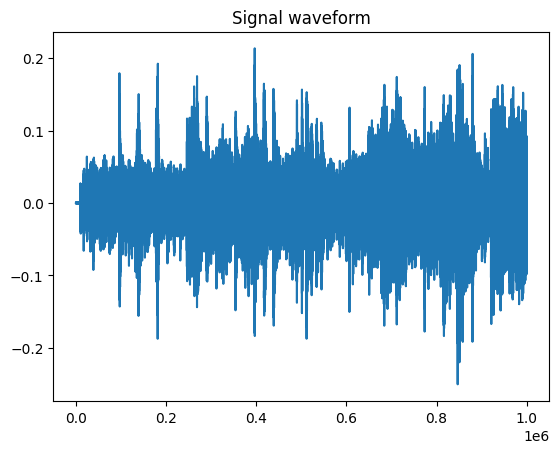

In [5]:
plt.plot(example_signal)
plt.title('Signal waveform')
plt.show()

## Obtaining melspectrogram(s)

In [6]:
# Converting above audio to melspectrogram:
example_melspectrogram = librosa.feature.melspectrogram(y=example_signal, sr=sr, n_fft=2048, hop_length=512, n_mels=512)
print('Shape of melspectrogram tensor:', example_melspectrogram.shape)

Shape of melspectrogram tensor: (512, 1954)


We see that 2 melspectrograms have been created (1 per audio channel, as our example audio has 2 channels). As mentioned before, we shall consider only 1 channel, disregarding the other. However, the above was done to (1) demonstrate that 2 spectrograms are indeed created, 1 per channel, and (2) compare the 2 spectrograms check for notably significant differences (if at all).

---

Now, converting the amplitudes in the melspectrograms to a logarithmic scale (i.e. to decibels)...

In [20]:
example_db_spectrogram = librosa.amplitude_to_db(example_melspectrogram)

**IMPLEMENTATION NOTE:** `librosa.amplitude_to_db`:

`librosa.amplitude_to_db` converts an amplitude spectrogram to decibel-scaled spectrogram (hence, rescales the signal power's measurement).

**CONCEPTUAL NOTE: Why convert signal power to a decible scale?**

Because the decibel scale more closely matches human perception of sounds, hence is more suitable to tackle musical aesthetics.

---

Now, viewing the above log-scaled melspectrograms...

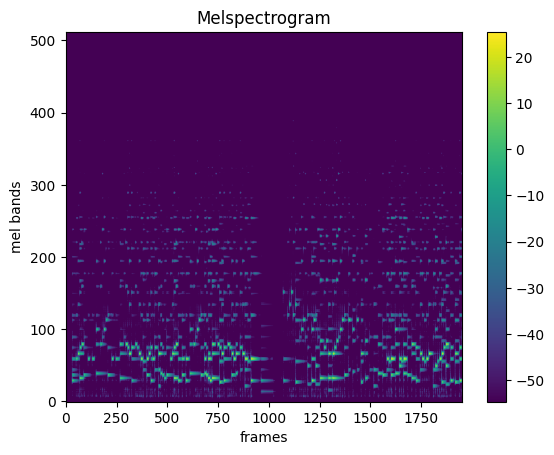

In [21]:
fig, ax = plt.subplots()
img = ax.imshow(example_db_spectrogram, aspect='auto', origin='lower')
fig.colorbar(img)
ax.set_title('Melspectrogram')
ax.set_xlabel('frames')
ax.set_ylabel('mel bands')

# NOTE: The colorbar that indicates amplitude

plt.show()

## Obtaining MFCCs

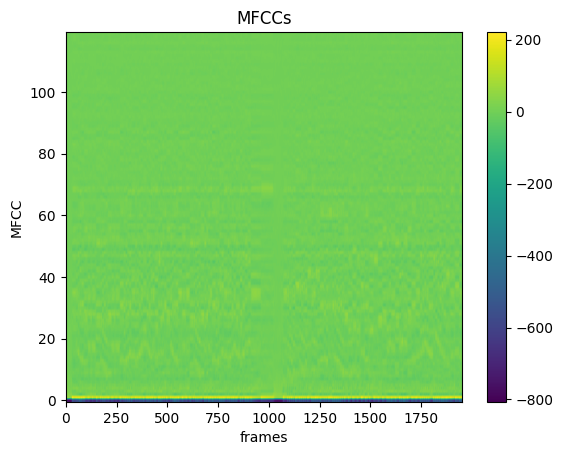

In [22]:
example_mfccs = librosa.feature.mfcc(y=example_signal, n_fft=2048, hop_length=512, n_mfcc=120)
fig, ax = plt.subplots()
img = ax.imshow(example_mfccs, aspect='auto', origin='lower')
fig.colorbar(img)
ax.set_title('MFCCs')
ax.set_xlabel('frames')
ax.set_ylabel('MFCC')
plt.show()

**NOTE**: `mfccs` contains an array of arrays, wherein each subarray is the set of MFCCs for a particular frame.

# Converting audio data to actual audio
## MFCC to audio
More specifically, we convert:

- MFCCs to melspectrogram (frequency-domain data)
- Melspectrogram to signal (time-domain signal)

In [23]:
example_reconstructed_signals_from_mfcc = []
n_mfcc_list = [40, 500, 2000]
for n_mfcc in n_mfcc_list:
    mfccs = librosa.feature.mfcc(y=example_signal, n_fft=2048, hop_length=512, n_mfcc=n_mfcc)
    example_reconstructed_signals_from_mfcc.append(librosa.feature.inverse.mfcc_to_audio(mfccs, sr=22050, n_mels=256, n_fft=2048, hop_length=512))

In [24]:
for i in range(len(n_mfcc_list)):
    print('\nCASE: Number of MFCCs =', n_mfcc_list[i])
    print('Shape of reconstructed signal tensor:', example_reconstructed_signals_from_mfcc[i].shape)
    audio_element_url = ipd.Audio(example_reconstructed_signals_from_mfcc[i], rate=22050)
    ipd.display(audio_element_url)


CASE: Number of MFCCs = 40
Shape of reconstructed signal tensor: (999936,)



CASE: Number of MFCCs = 500
Shape of reconstructed signal tensor: (999936,)



CASE: Number of MFCCs = 2000
Shape of reconstructed signal tensor: (999936,)


## Melspectrogram to audio

In [12]:
example_reconstructed_signals_from_mel = []
n_mels_list = [128, 256, 512]
for n_mels in n_mels_list:
    melspectrogram = librosa.feature.melspectrogram(y=example_signal, sr=22050, n_fft=2048, hop_length=512, n_mels=n_mels)
    example_reconstructed_signals_from_mel.append(librosa.feature.inverse.mel_to_audio(melspectrogram, sr=22050, n_fft=2048, hop_length=512))

In [13]:
for i in range(len(n_mels_list)):
    print('\nCASE: Number of mel bands =', n_mels_list[i])
    print('Shape of reconstructed signal tensor:', example_reconstructed_signals_from_mel[i].shape)
    audio_element_url = ipd.Audio(example_reconstructed_signals_from_mel[i], rate=22050)
    ipd.display(audio_element_url)


CASE: Number of mel bands = 128
Shape of reconstructed signal tensor: (999936,)



CASE: Number of mel bands = 256
Shape of reconstructed signal tensor: (999936,)



CASE: Number of mel bands = 512
Shape of reconstructed signal tensor: (999936,)


# Experiments
## Increasing Griffin-Lim iterations
Does increasing the number of iterations for applying Griffin-Lim help? By changing the `n_iter` option (that defaults to 32) in `librosa.feature.inverse.mel_to_audio`, you can apply Griffin-Lim for more iterations. Doing so did not improve the sound quality in my case., given the same sampling rate of 22050 Hz.

## Changes to some parameters

Note that we shall consider the default parameters as:

- Hop length = 512
- Window length (i.e. FFT window length) = 2048
- Sampling rate = 22050 Hz
- Mel bands = 512

The following improved sound quality to similar degrees:

- Increasing sampling rate to 44100 (all else equal) (remember to use the same for loading audio)
- Increasing number of mel bands to 1024 (all else equal)
- Reducing hop length to 256 (all else equal)

In general, I found that:

- Increasing the ratio of hop length to window length worsened results (all else equal)
- Reducing window length along with hop length by the same proportion improved results (all else equal)
- Increasing the window length worsened results after a point (~2048) (all else equal)
- Reducing window length along with hop length beyond a certain point worsened results (~1024) (all else equal)

---

**Understanding the results**...

Greater sampling rate leads to a greater resolution in terms of samples (i.e. more samples for the same audio file). Smaller hop length leads to greater resolution in terms of frames (i.e. more frames are created for the same audio file). Smaller window length could allow FFTs to be calculated more accurately for the waveform, but making the windows too small can lead to less accurate FFTs overall since the waveform's shape may not be captured well over a longer time period.

**Code used for testing**...

```python
hop_length = 512
n_fft = 2048 # FFT window length
sr = 22050
n_mels = 512

# Load an example audio file:
example_audio_folder = audio_content_folder
example_audio_name = 'Piano-Concerto-21-in-C-major-K467-II-Andante.mp3'
# Obtaining the time-domain signal:
example_signal, _ = librosa.load(example_audio_folder + '/' + example_audio_name, sr=sr)
# Truncating the signal to lessen computational load for demonstration purposes: 
example_signal = example_signal[:1000000]
# Playing the original file for reference:
audio_element_url = ipd.Audio(example_signal, rate=sr)
ipd.display(audio_element_url)

# Converting to melspectrogram then converting back to time-domain signal to check quality loss:
melspectrogram = librosa.feature.melspectrogram(y=example_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
example_reconstructed_signal = librosa.feature.inverse.mel_to_audio(melspectrogram, sr=sr, n_fft=n_fft, hop_length=hop_length)
audio_element_url = ipd.Audio(example_reconstructed_signal, rate=sr)
ipd.display(audio_element_url)
```

---

## Viability of melspectrogram with signal power measured in decibel scale
Too much data loss from the decibel scale conversion leads to a noisy signal upon reconstruction.

**Code used for testing**...

```python
db_melspectrogram = librosa.amplitude_to_db(librosa.feature.melspectrogram(y=example_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=512))
example_reconstructed_signal_from_mel = librosa.feature.inverse.mel_to_audio(librosa.db_to_amplitude(db_melspectrogram), sr=sr, n_fft=n_fft, hop_length=hop_length)
audio_element_url = ipd.Audio(example_reconstructed_signal_from_mel, rate=sr)
ipd.display(audio_element_url)
```